This notebook contains various visualization to gauge cleaning success and its effect(s) on next activity prediction.

# SETUP

##Imports

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import pickle

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## Globals

In [ ]:
pollution_types_1 = ["DISTORTED", "POLLUTED.NORND", "POLLUTED.RANDOM"]
pollution_types_2 = ["DISTORTED-activity", "POLLUTED.NORND-activity", "POLLUTED.RANDOM-activity", "SYNONYM", "HOMONYM"]
pollution_types_3 = ["DISTORTED-activity", "POLLUTED.NORND-activity", "POLLUTED.RANDOM-activity", "SYNONYM"]
percentages = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
percentages_0 = [0., 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
profiling_metrics = ['UNKNOWNS', 'DISTINCT', 'AVG_DISTINCT_PER_CASE', 'UNIQUENESS']
dq_scorings = ["accuracy", "precision", "recall", "f1"]
metrics = profiling_metrics+dq_scorings
metrics_time = metrics + ["time"]
limit = 3

dataset_converter = {
    "BPIC11_f1": "BPIC'11",
    "BPIC15_1_f2": "BPIC'15",
    "Credit": "Credit",
    "Pub": "Pub"
}

label_converter = {
    "overall_accuracy": "Overall Evaluation Accuracy",
    "overall_precision": "Overall Evaluation Precision",
    "overall_recall": "Overall Evaluation Recall",
    "overall_fscore": "Overall Evaluation F1-Score"
}

key_converter = {
    "DISTORTED-activity": "DISTORTED",
    "POLLUTED.NORND-activity": "POLLUTED.NORND",
    "POLLUTED.RANDOM-activity": "POLLUTED.RANDOM",
    "DISTORTED": "DISTORTED",
    "POLLUTED.NORND": "POLLUTED.NORND",
    "POLLUTED.RANDOM": "POLLUTED.RANDOM",
    "SYNONYM": "SYNONYM",
    "HOMONYM": "HOMONYM"
}

cleaning_methods = ["CLUSTERING", "CLUSTERING-HAMMING", "SEQUENCES"]

key_converter_eval = {
    "CLUSTERING": "clustering_cleaning/Levenshtein",
    "CLUSTERING-HAMMING": "clustering_cleaning/Hamming",
    "SEQUENCES": "sequences_cleaning"
}

key_converter_cleaning = {
    "clustering-lev": "clustering_cleaning/Levenshtein",
    "clustering-ham": "clustering_cleaning/Hamming",
    "sequences": "sequences_cleaning"
}

## Functions

In [ ]:
def summary_stats_plot_by_pollution(pollution_type, uncleaned_scores, clustering_scores, hamming_scores, sequences_scores):

  fig, axes = plt.subplots(3, 3, figsize=(30, 20)) #tentative
  axes = axes.flatten()

  for i, metric in enumerate(metrics_time):

    # Original
    y = [uncleaned_scores[pollution_type][percentage][metric] for percentage in percentages_0]
    axes[i].plot(percentages_0, y, linestyle="dashed", marker="o", label="original", linewidth=3, color='lightgreen')

    # clustering_cleaning
    y = [clustering_scores[pollution_type][percentage][metric] for percentage in percentages]
    axes[i].plot(percentages, y, marker="o", label="clustering-lev", linewidth=3, color='red')

    # clustering_cleaning-HAMMING
    y = [hamming_scores[pollution_type][percentage][metric] for percentage in percentages]
    axes[i].plot(percentages, y, marker="o", label="clustering-ham", linewidth=3, color='green')

    # sequences_cleaning
    y = [sequences_scores[pollution_type][percentage][metric] for percentage in percentages]
    axes[i].plot(percentages, y, marker="o", label="sequences", linewidth=3, color='blue')

    axes[i].set_xlabel("Corruption percentage")
    axes[i].set_ylabel(metric)
    axes[i].set_title(f"{metric} in {dataset_converter[dataset]}")
    axes[i].legend()
    axes[i].grid(True)

  fig.suptitle(f"Summary statistics of dataset {dataset_converter[dataset]} with {pollution_type} pollution before and after cleaning with different techniques", y=1)
  fig.tight_layout()
  fig.show()

In [ ]:
def fetch_cleaning_scores(dataset, pollution_types):
  uncleaned_scores = []
  for pollution_type in pollution_types:
    with open(f"{dataset}/{dataset}/REFERENCE_{dataset}_{pollution_type}.pickle", "rb") as f:
      uncleaned_scores.append(pickle.load(f))
  uncleaned_scores = dict(zip(pollution_types, uncleaned_scores))

  clustering_scores = []
  for pollution_type in pollution_types:
    with open(f"{dataset}/{dataset}/CLEANING_{dataset}_{pollution_type}_clustering.pickle", "rb") as f:
      clustering_scores.append(pickle.load(f))
  clustering_scores = dict(zip(pollution_types, clustering_scores))

  hamming_scores = []
  for pollution_type in pollution_types:
    with open(f"{dataset}/{dataset}/CLEANING_{dataset}_{pollution_type}_clustering-HAMMING.pickle", "rb") as f:
      hamming_scores.append(pickle.load(f))
  hamming_scores = dict(zip(pollution_types, hamming_scores))

  sequences_scores = []
  for pollution_type in pollution_types:
    with open(f"{dataset}/{dataset}/CLEANING_{dataset}_{pollution_type}_sequences.pickle", "rb") as f:
      sequences_scores.append(pickle.load(f))
  sequences_scores = dict(zip(pollution_types, sequences_scores))

  return uncleaned_scores, clustering_scores, hamming_scores, sequences_scores

In [ ]:
def eval_overview(dataset, pollution_types):
  eval_dirty_scores = {}
  for pollution_type in pollution_types:
    with open(f'./{dataset}/{dataset}/AVG_SCORES_{dataset}-TRAIN-{pollution_type}.pickle', 'rb') as f:
      eval_dirty_scores[pollution_type] = pickle.load(f)

  fig, axes = plt.subplots(2, 2, figsize=(15, 10)) #tentative
  axes = axes.flatten()

  x = percentages_0

  for i, score in enumerate(["overall_accuracy", "overall_precision", "overall_recall", "overall_fscore"]):
    for j, pollution_type in enumerate(pollution_types):
      y = [eval_dirty_scores[pollution_type][percentage][score] for percentage in percentages_0]
      axes[i].plot(x, y, linestyle="-", marker="o", label=key_converter[pollution_type], linewidth=3)
    axes[i].set_xlabel("Corruption percentage")
    axes[i].set_ylabel(score)
    axes[i].set_title(f"{label_converter[score]} in {dataset_converter[dataset]}")
    axes[i].legend()
    axes[i].grid(True)

  # fig.suptitle(f"Summary evaluation metrics for next activity prediction with dataset {dataset_converter[dataset]}", y=1)
  fig.tight_layout()
  fig.show()

In [ ]:
def eval_by_pollution_type(dataset, pollution_type):

  with open(f'./{dataset}/{dataset}/AVG_SCORES_{dataset}-TRAIN-{pollution_type}.pickle', 'rb') as f:
      eval_uncleaned_score = pickle.load(f)

  eval_cleaned_scores = {}
  for cleaning_method in cleaning_methods:
    with open(f'./{dataset}/{dataset}/AVG_SCORES_{dataset}-TRAIN-{pollution_type}-CLEANED-{cleaning_method}.pickle', 'rb') as f:
      eval_cleaned_scores[cleaning_method] = pickle.load(f)

  fig, axes = plt.subplots(2, 2, figsize=(15, 10)) #tentative
  axes = axes.flatten()


  for i, score in enumerate(["overall_accuracy", "overall_precision", "overall_recall", "overall_fscore"]):
    y = [eval_uncleaned_score[percentage][score] for percentage in percentages_0]
    axes[i].plot(percentages_0, y, linestyle="dashed", marker="o", label="Uncleaned", linewidth=3, color="brown")

    for j, cleaning_method in enumerate(cleaning_methods):
      y = [eval_cleaned_scores[cleaning_method][percentage][score] for percentage in percentages]
      axes[i].plot(percentages, y, linestyle="-", marker="o", label=key_converter_eval[cleaning_method], linewidth=3)
    axes[i].set_xlabel("Corruption percentage")
    axes[i].set_ylabel(score)
    axes[i].set_title(f"{label_converter[score]} after cleaning on {dataset_converter[dataset]}")
    axes[i].legend()
    axes[i].grid(True)

  # fig.suptitle(f"Summary evaluation metrics for next activity prediction with dataset {dataset_converter[dataset]}", y=1)
  fig.tight_layout()
  fig.show()

# BPIC11

In [ ]:
dataset = "BPIC11_f1"

## CLEANING

In [ ]:
uncleaned_scores, clustering_scores, hamming_scores, sequences_scores = fetch_cleaning_scores(dataset, pollution_types_1)

### DISTORTED

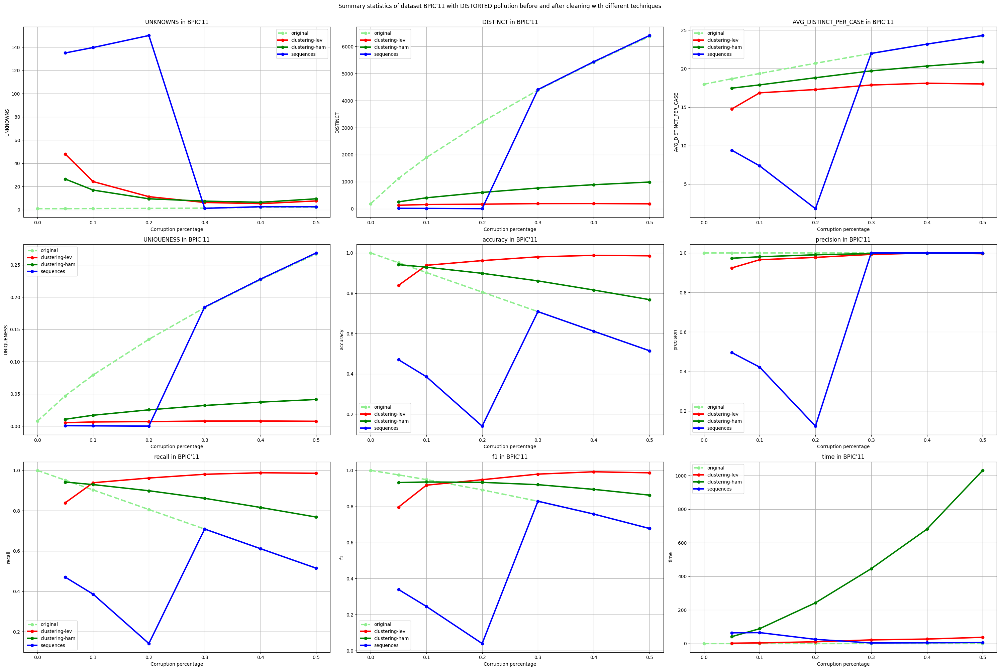

In [ ]:
summary_stats_plot_by_pollution("DISTORTED", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

### POLLUTED.NORND

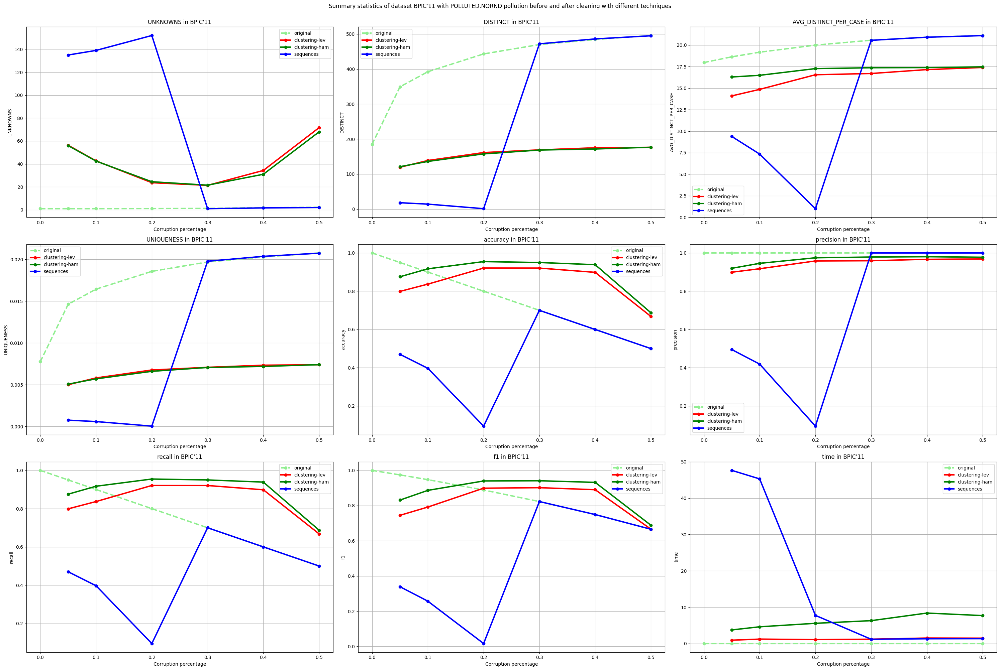

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.NORND", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

###POLLUTED.RANDOM

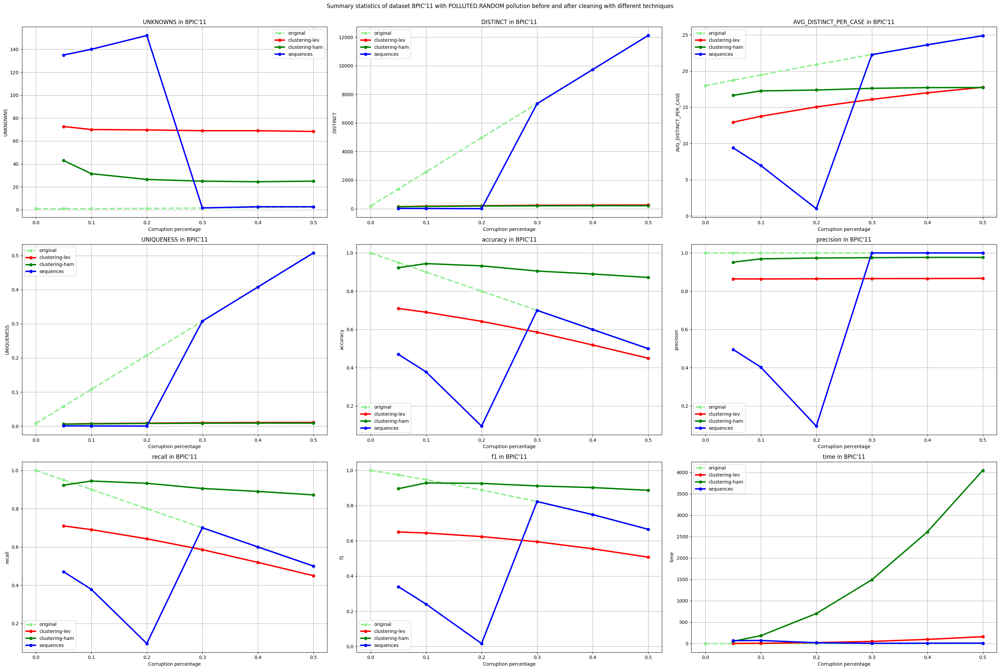

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.RANDOM", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

## EVALUATION

###OVERVIEW

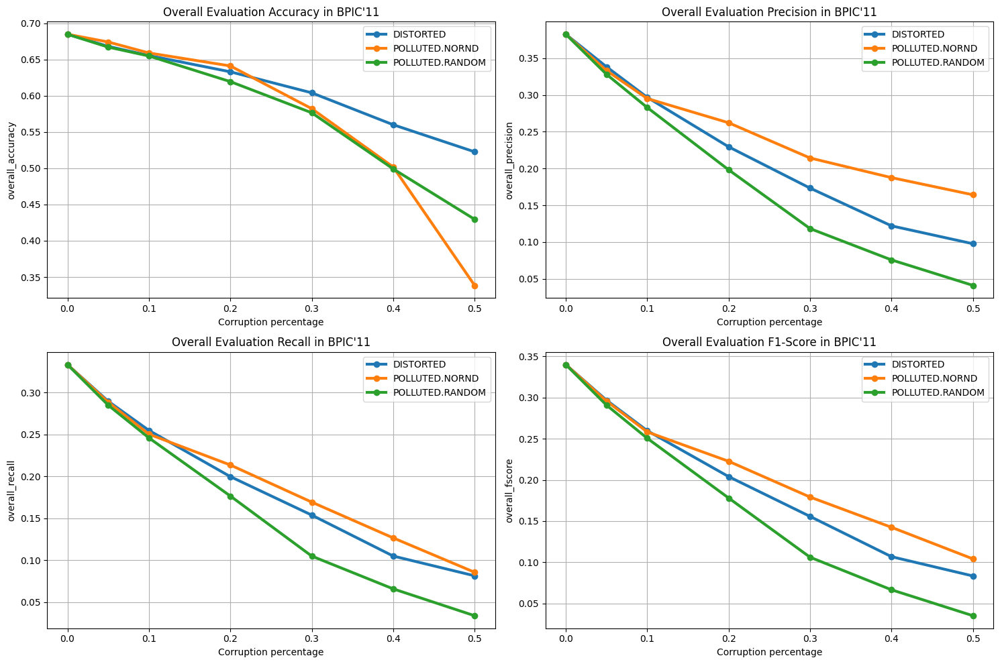

In [ ]:
eval_overview(dataset, pollution_types_1)

### DISTORTED

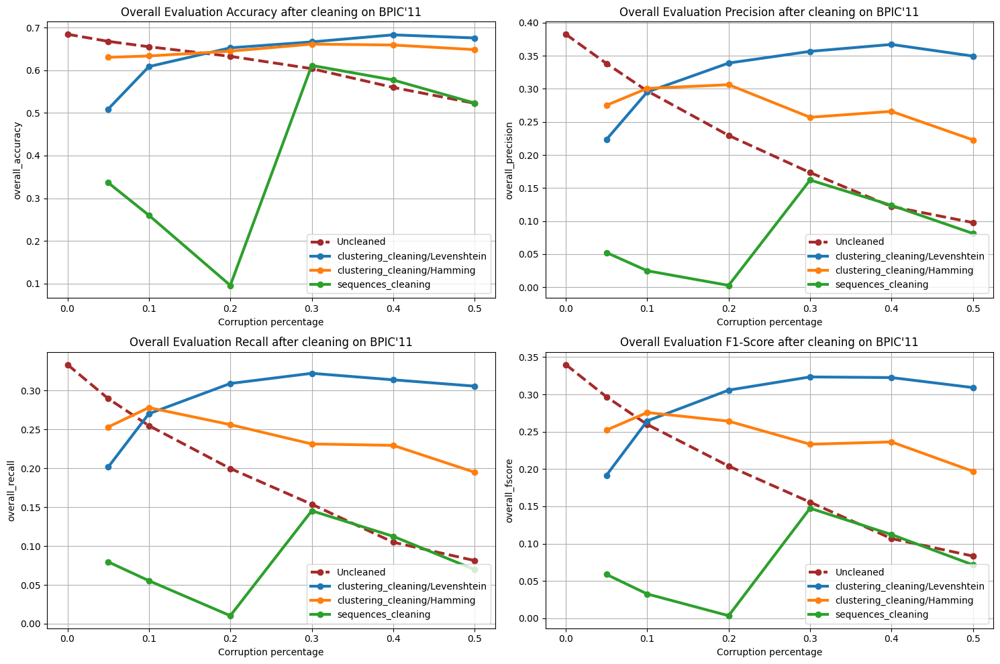

In [ ]:
eval_by_pollution_type(dataset, "DISTORTED")

### POLLUTED.NORND

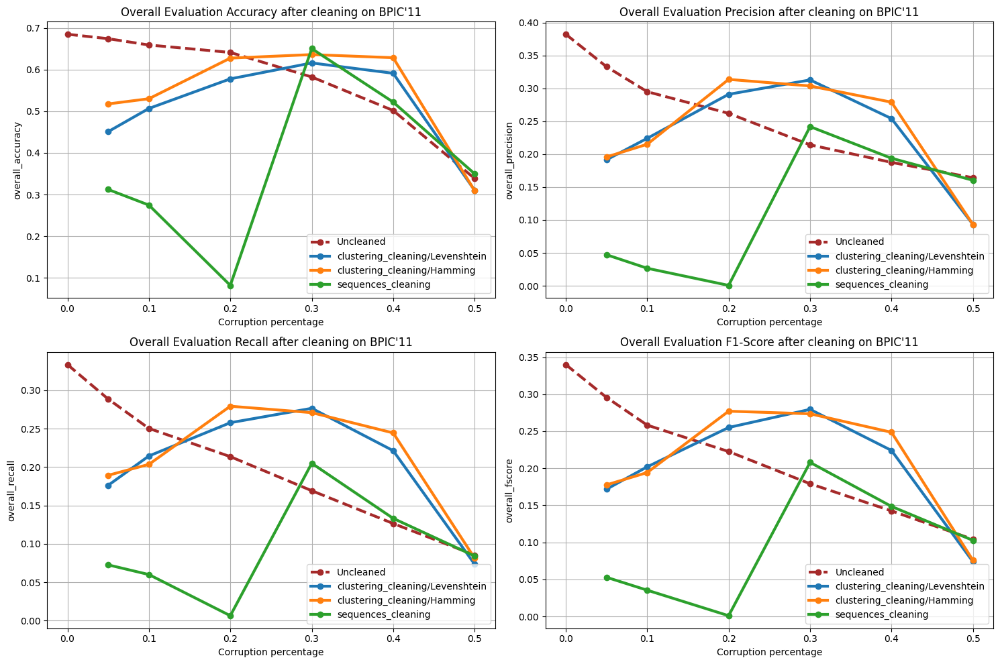

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.NORND")

### POLLUTED.RANDOM

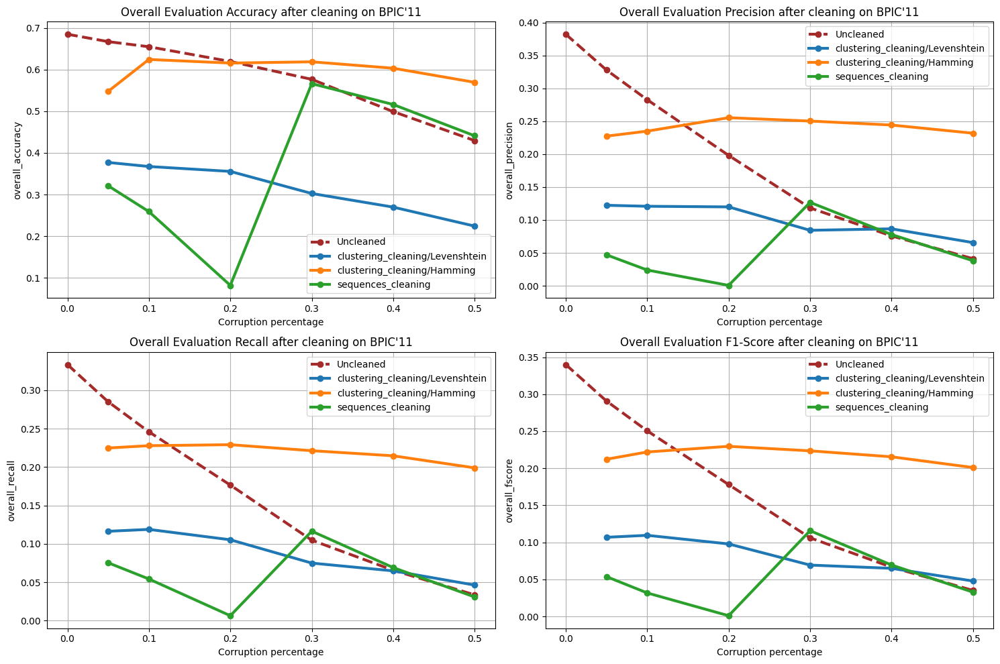

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.RANDOM")

# BPIC15

In [ ]:
dataset = "BPIC15_1_f2"

## CLEANING

In [ ]:
uncleaned_scores, clustering_scores, hamming_scores, sequences_scores = fetch_cleaning_scores(dataset, pollution_types_1)

### DISTORTED

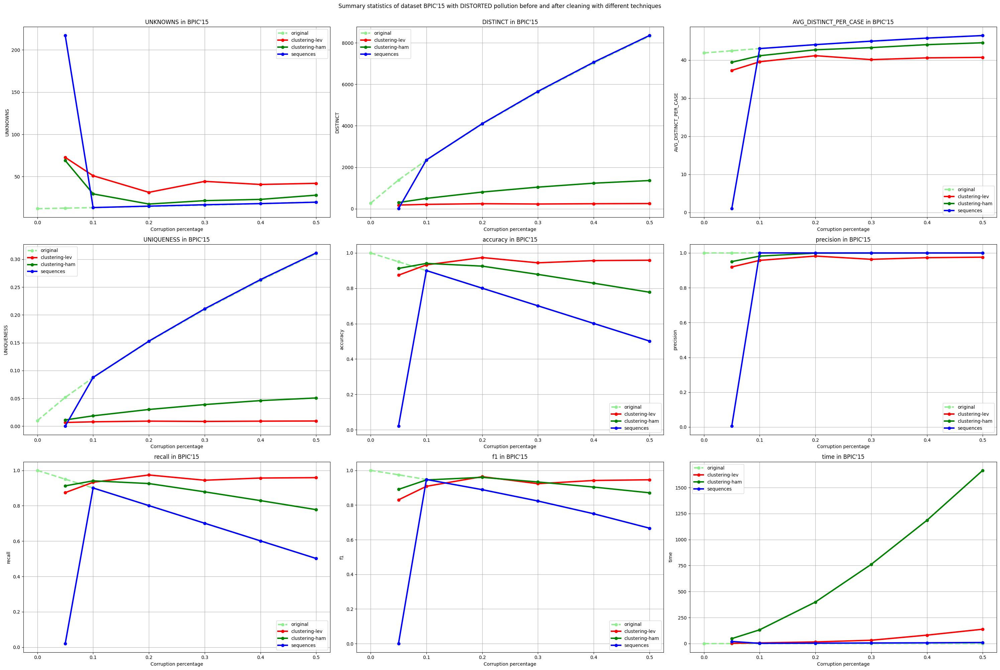

In [ ]:
summary_stats_plot_by_pollution("DISTORTED", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

### POLLUTED.NORND

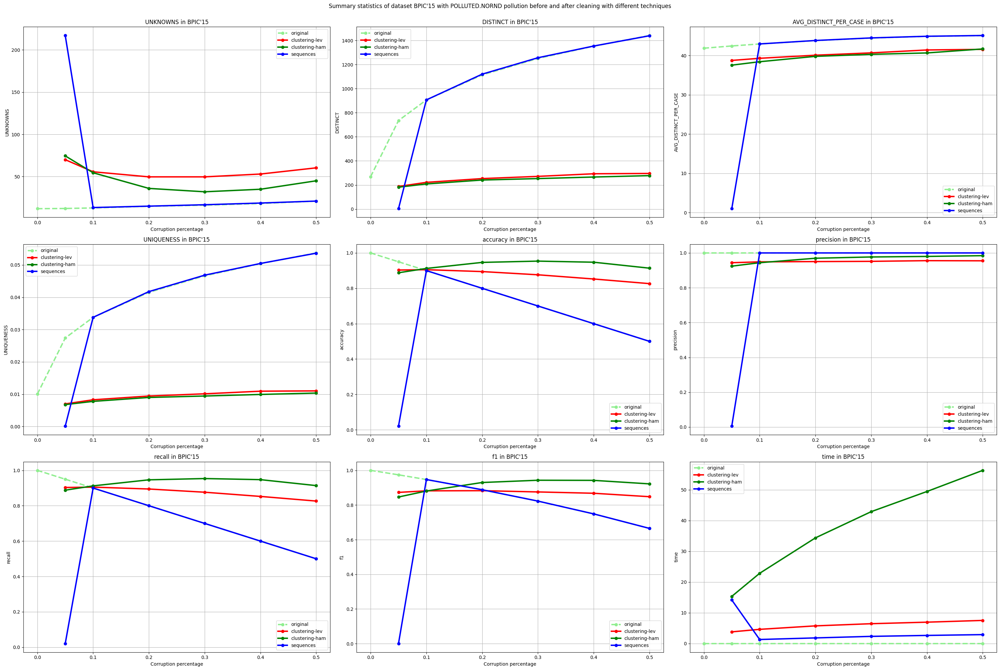

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.NORND", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

###POLLUTED.RANDOM

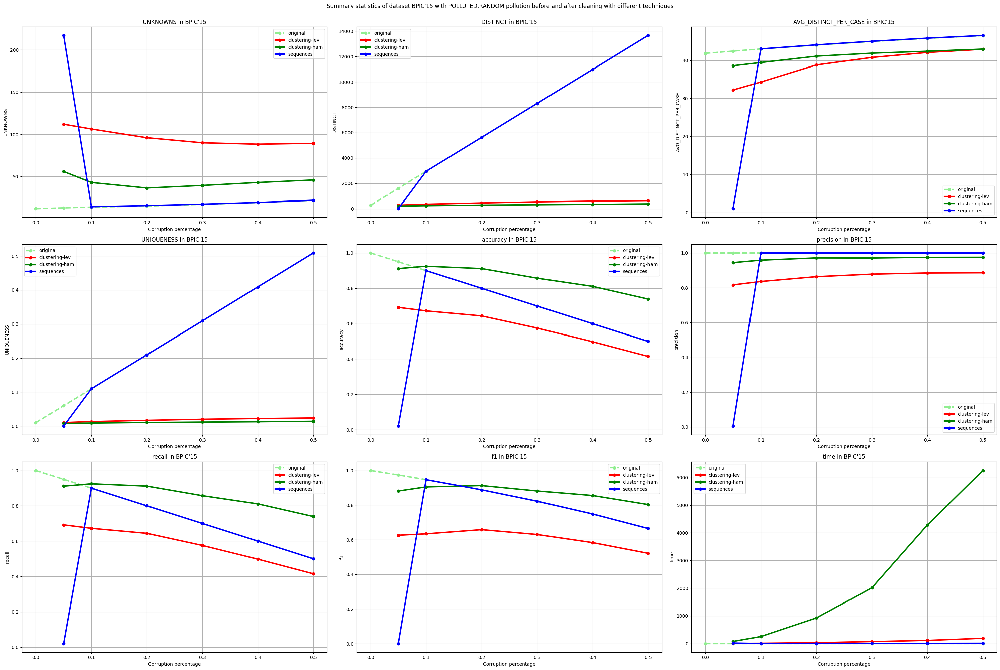

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.RANDOM", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

## EVALUATION

###OVERVIEW

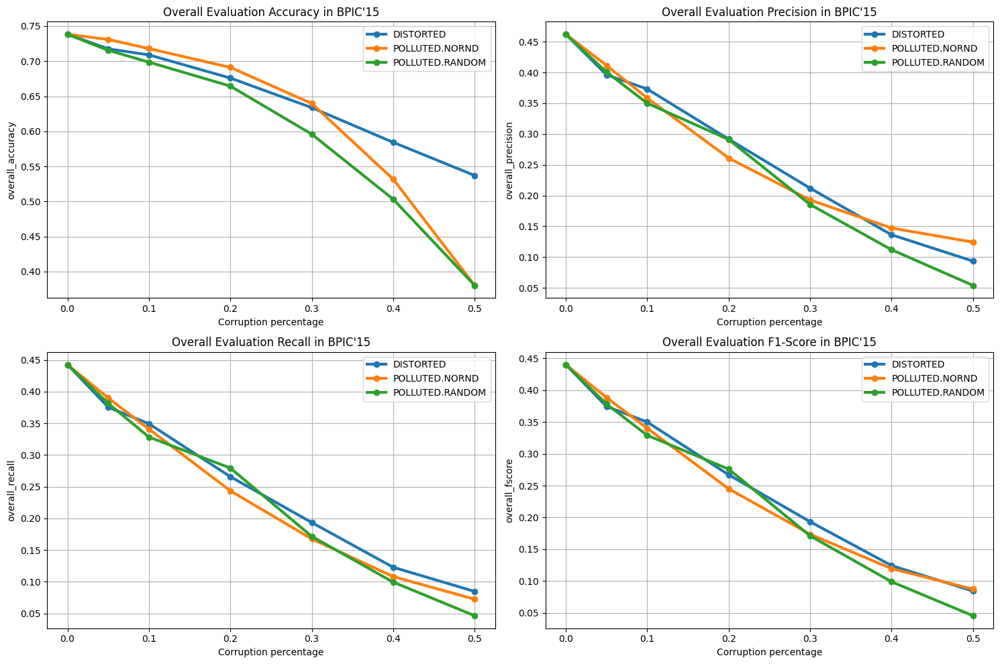

In [ ]:
eval_overview(dataset, pollution_types_1)

### DISTORTED

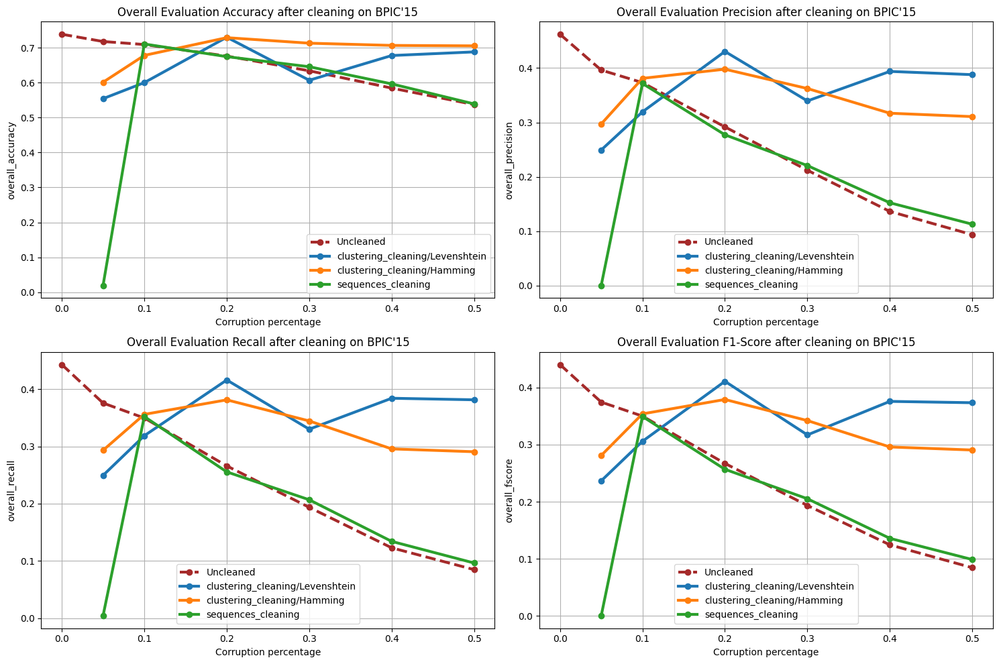

In [ ]:
eval_by_pollution_type(dataset, "DISTORTED")

### POLLUTED.NORND

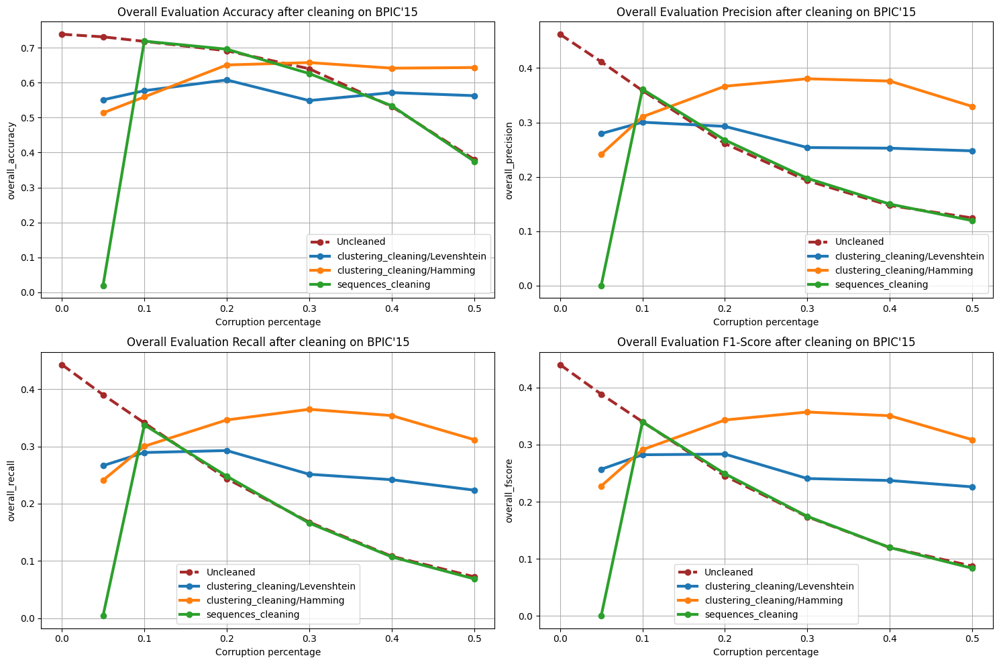

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.NORND")

### POLLUTED.RANDOM

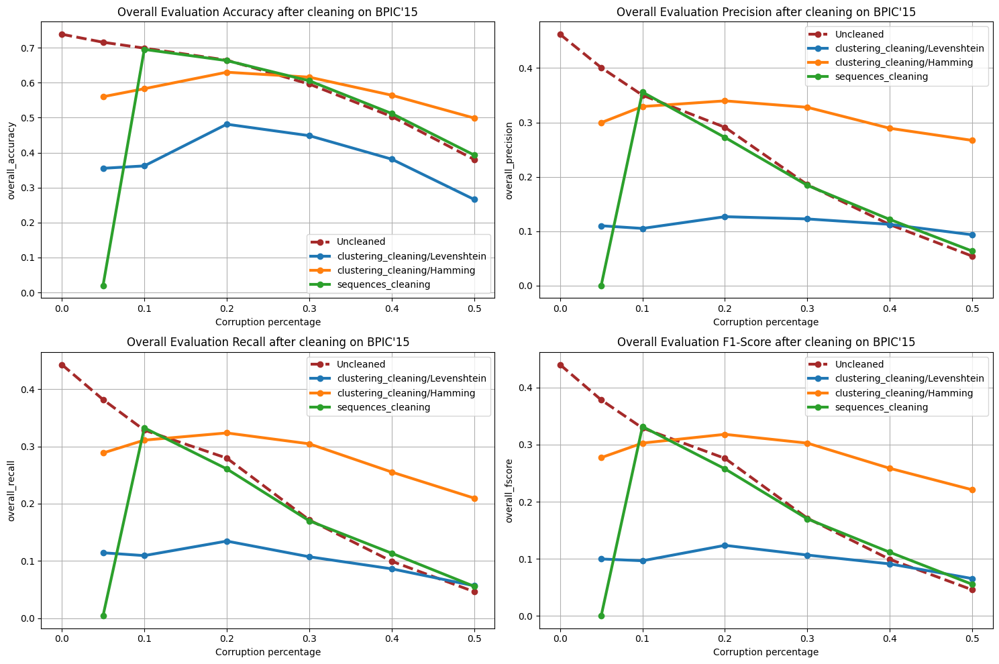

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.RANDOM")

# Credit

In [ ]:
dataset = "Credit"

## CLEANING

In [ ]:
uncleaned_scores, clustering_scores, hamming_scores, sequences_scores = fetch_cleaning_scores(dataset, pollution_types_2)

### DISTORTED

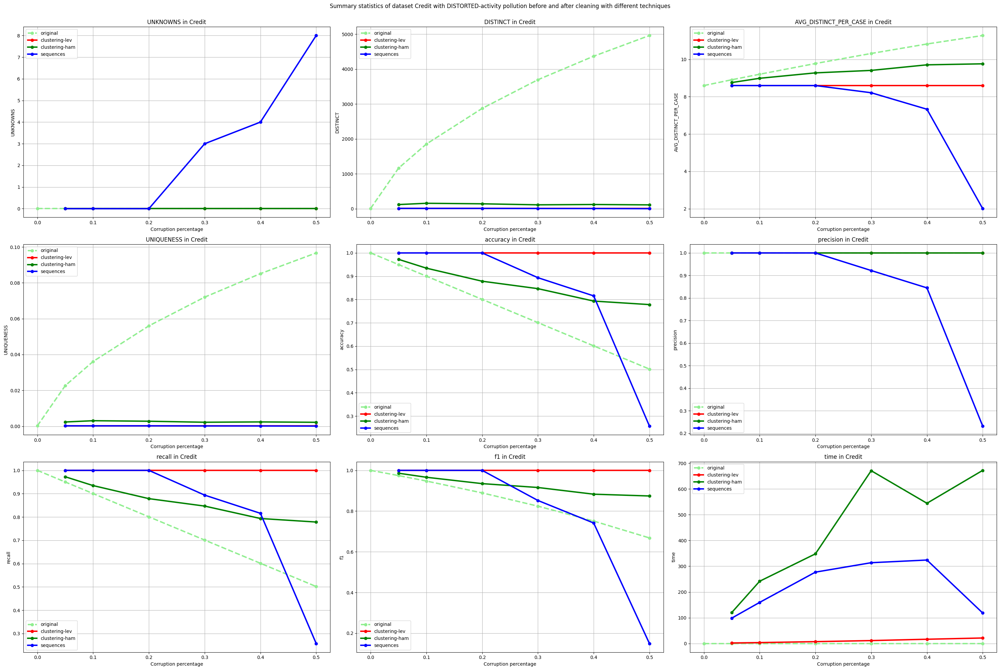

In [ ]:
summary_stats_plot_by_pollution("DISTORTED-activity", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

### POLLUTED.NORND

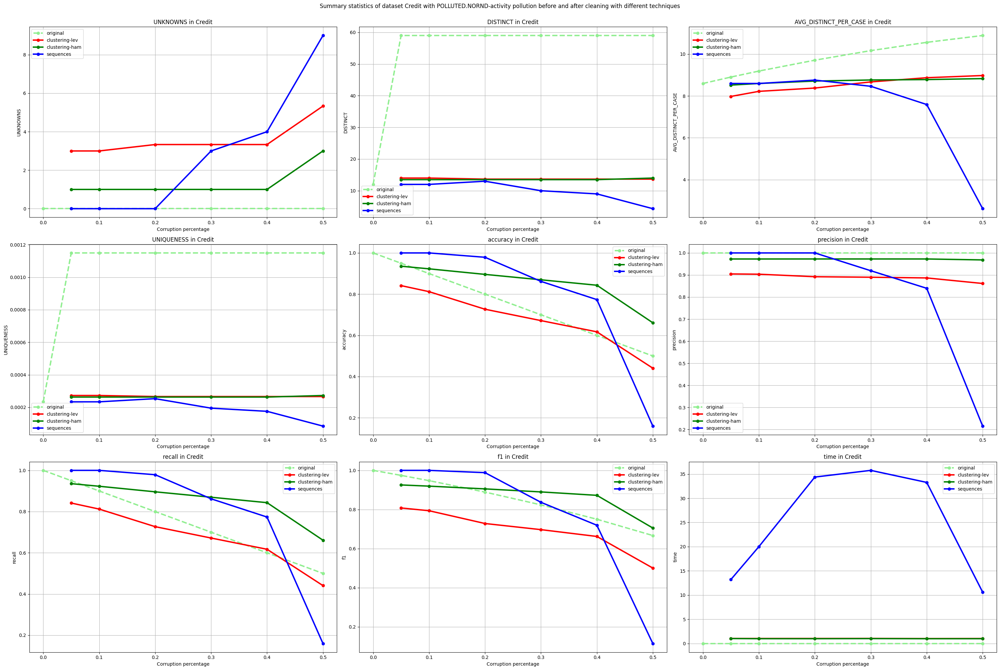

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.NORND-activity", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

###POLLUTED.RANDOM

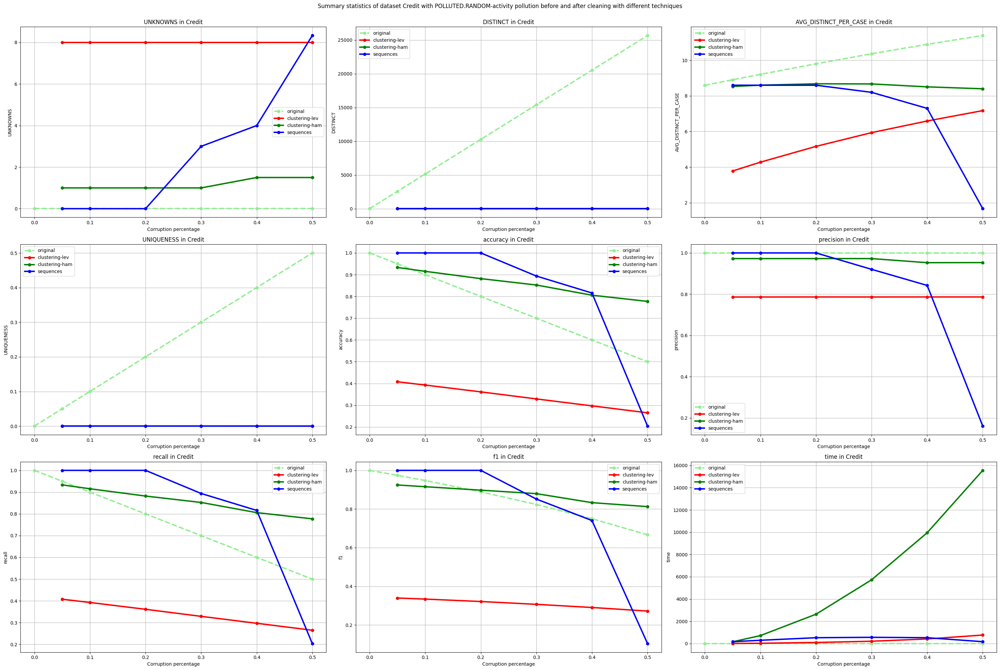

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.RANDOM-activity", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

### SYNONYM

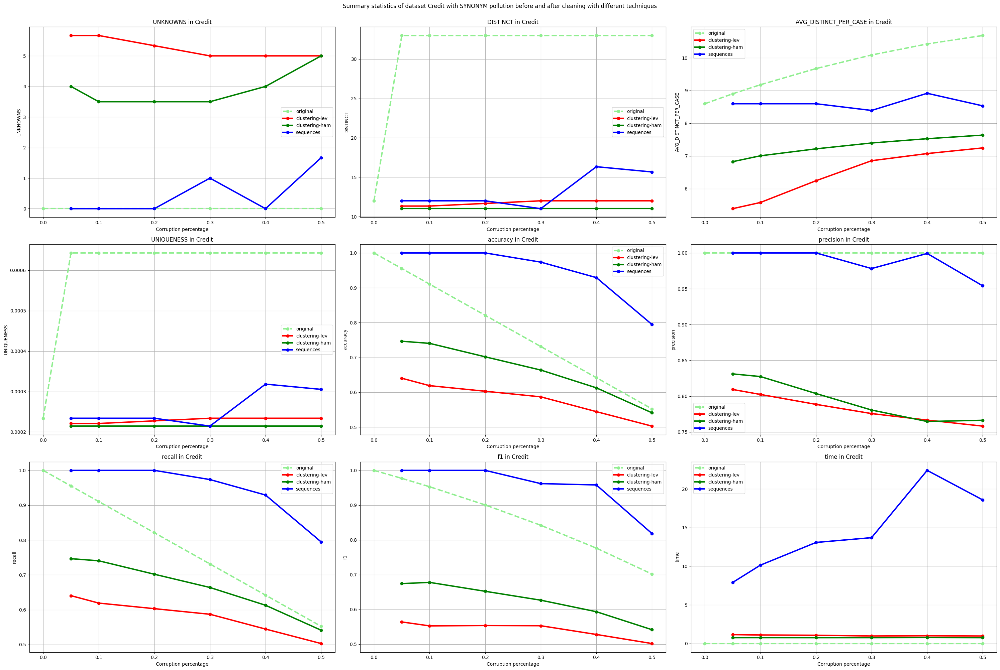

In [ ]:
summary_stats_plot_by_pollution("SYNONYM", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

### HOMONYM

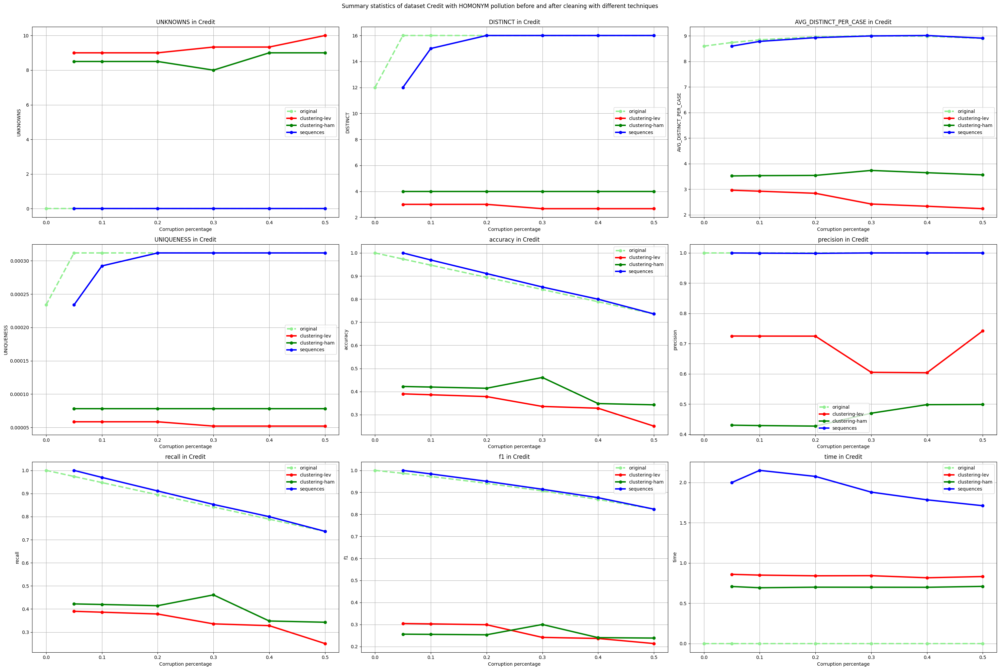

In [ ]:
summary_stats_plot_by_pollution("HOMONYM", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

## EVALUATION

###OVERVIEW

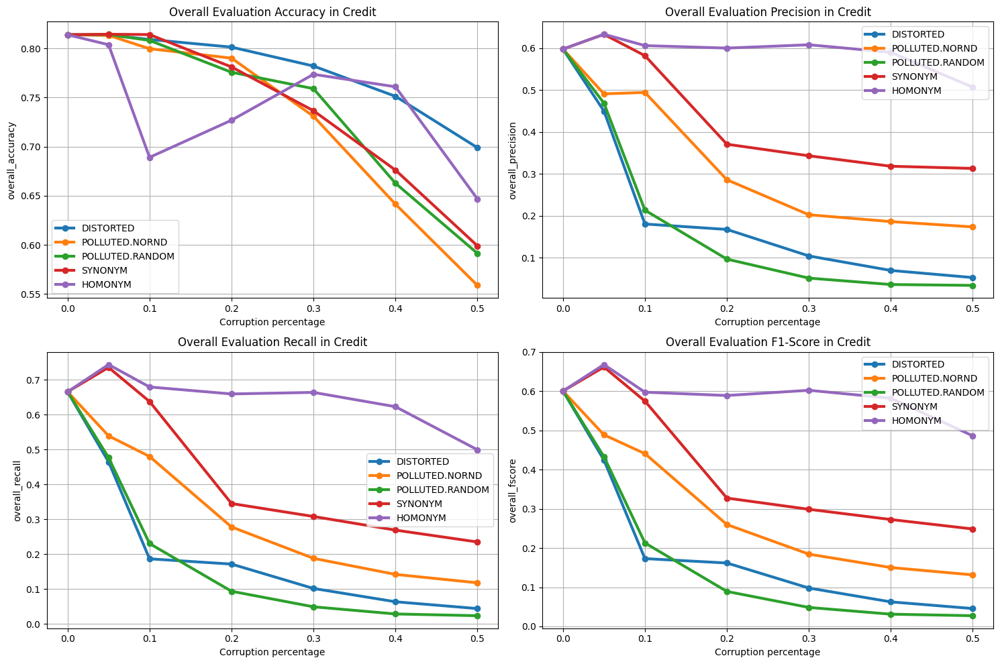

In [ ]:
eval_overview(dataset, pollution_types_2)

### DISTORTED

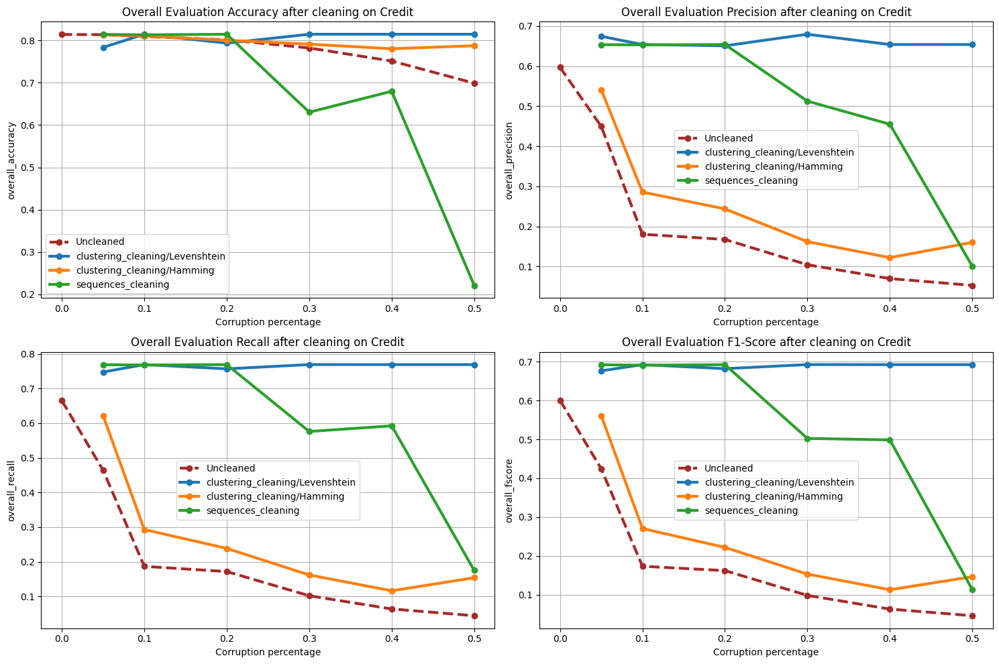

In [ ]:
eval_by_pollution_type(dataset, "DISTORTED-activity")

### POLLUTED.NORND

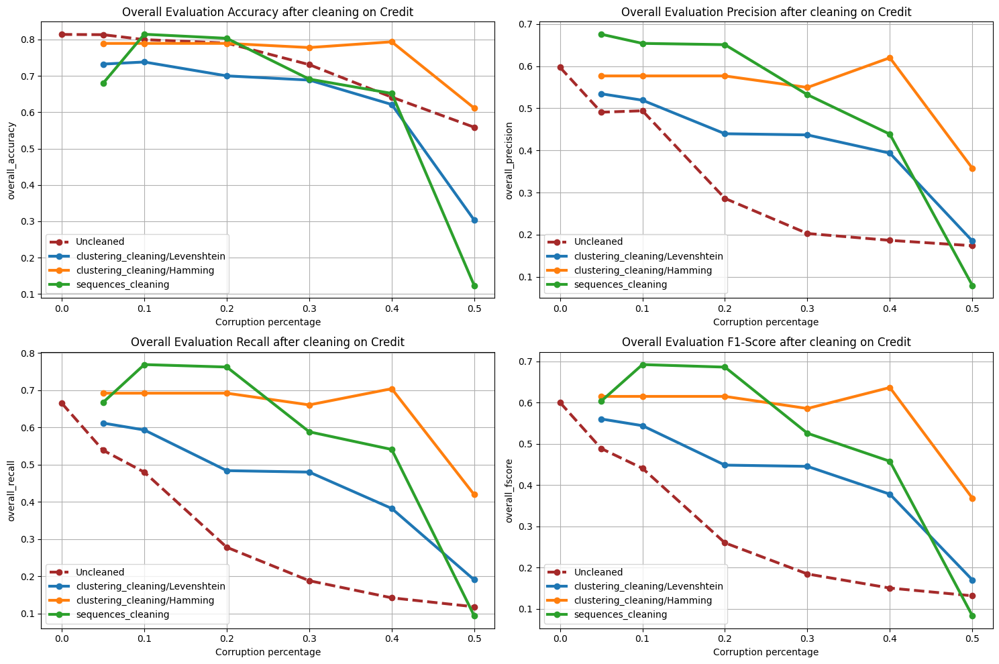

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.NORND-activity")

### POLLUTED.RANDOM

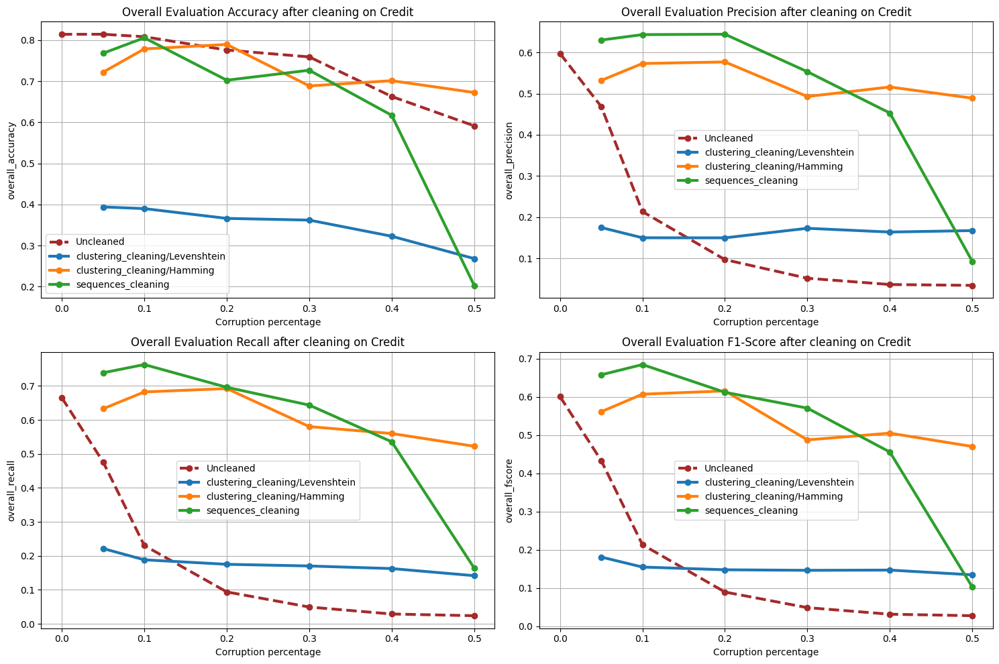

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.RANDOM-activity")

### SYNONYM

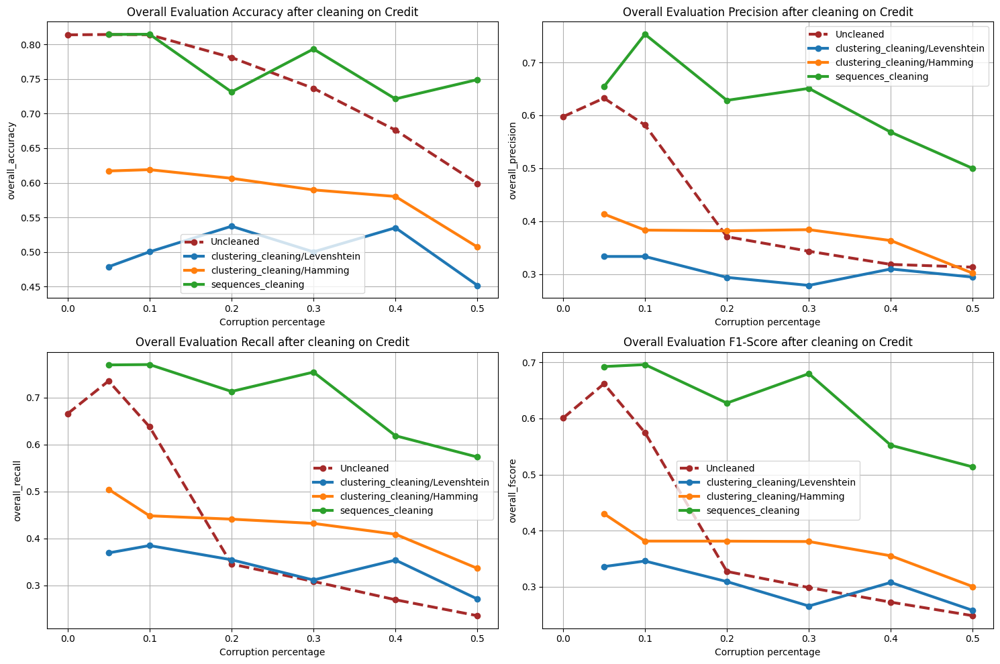

In [ ]:
eval_by_pollution_type(dataset, "SYNONYM")

### HOMONYM

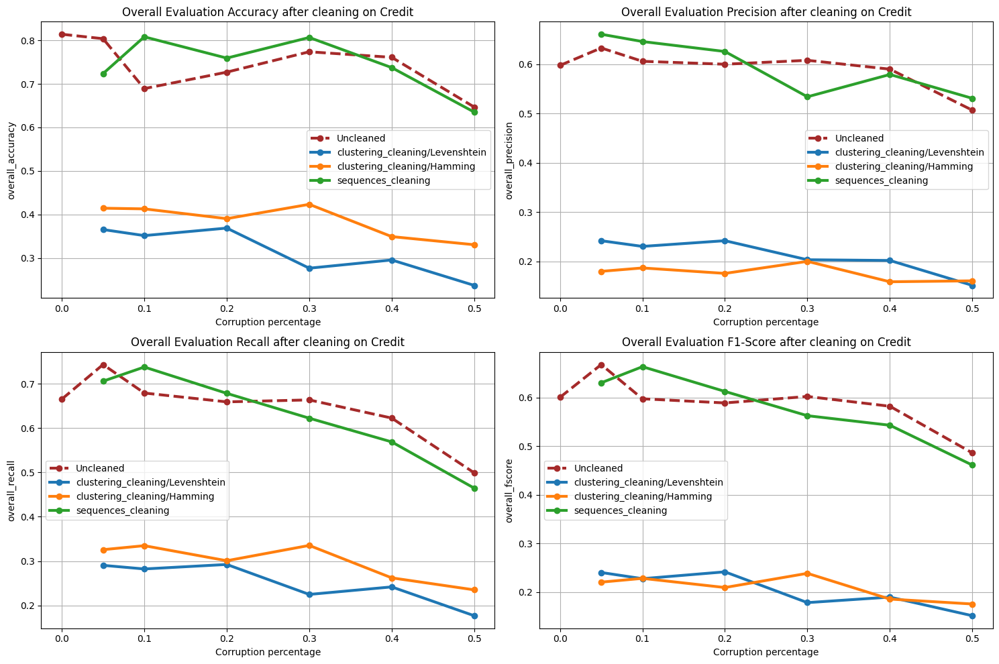

In [ ]:
eval_by_pollution_type(dataset, "HOMONYM")

# Pub

In [ ]:
dataset = "Pub"

## CLEANING

In [ ]:
uncleaned_scores, clustering_scores, hamming_scores, sequences_scores = fetch_cleaning_scores(dataset, pollution_types_3)

### DISTORTED

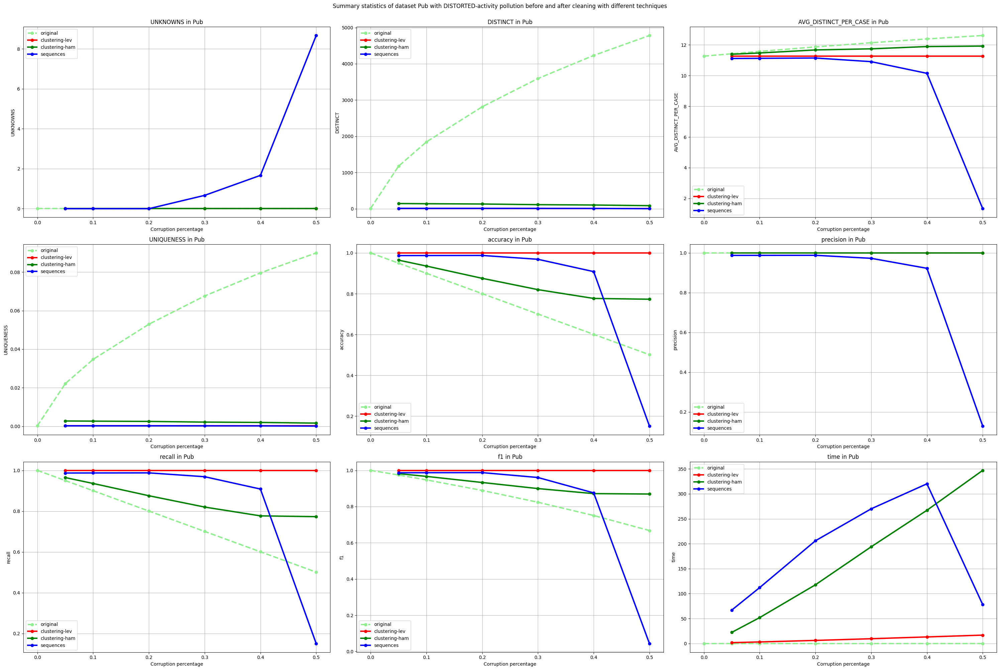

In [ ]:
summary_stats_plot_by_pollution("DISTORTED-activity", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

### POLLUTED.NORND

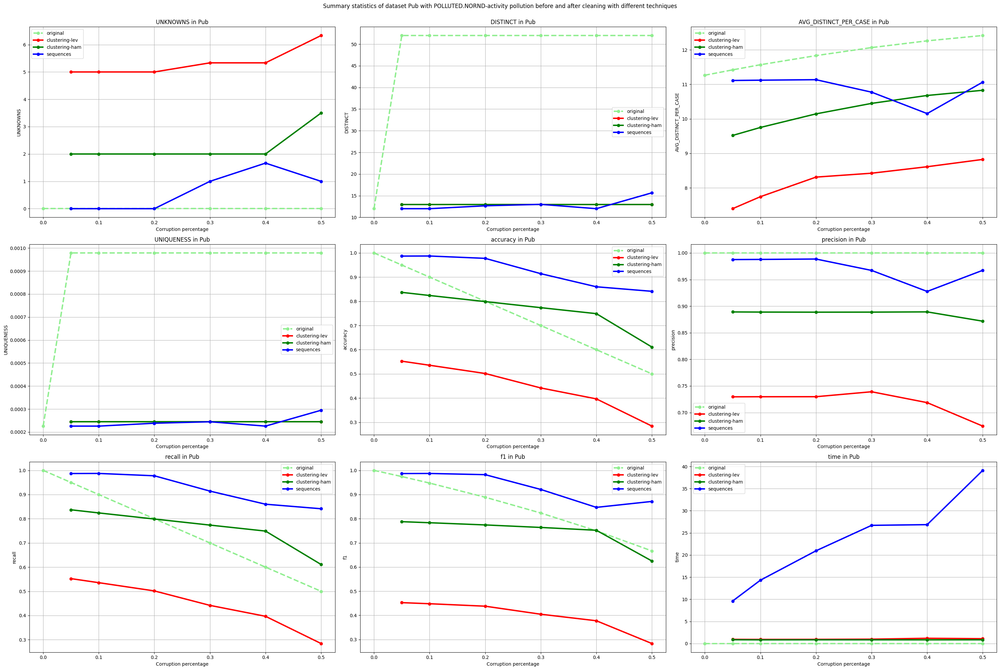

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.NORND-activity", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

###POLLUTED.RANDOM

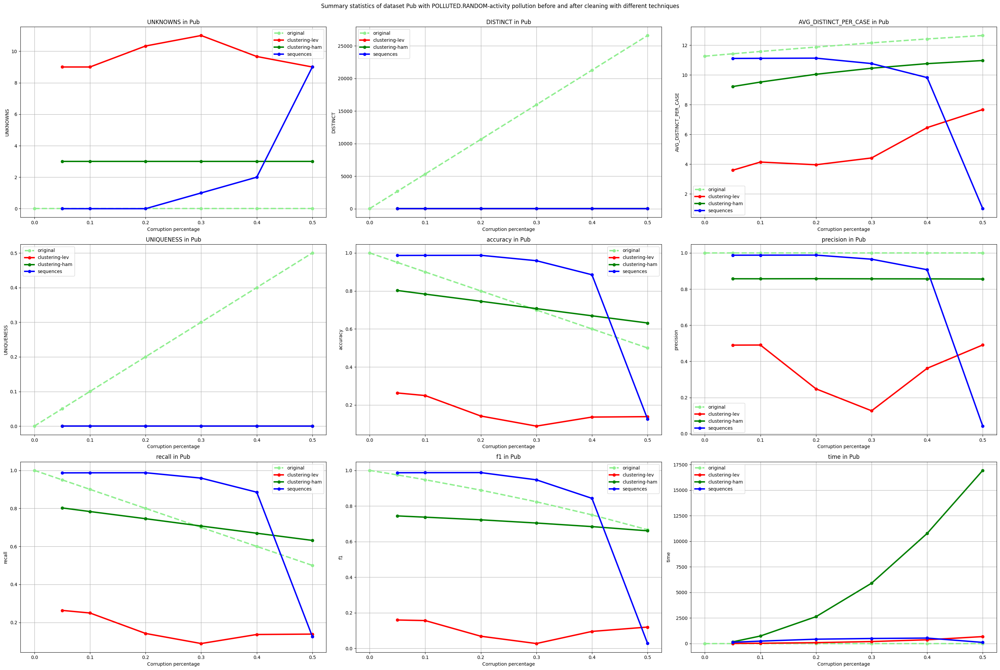

In [ ]:
summary_stats_plot_by_pollution("POLLUTED.RANDOM-activity", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

### SYNONYM

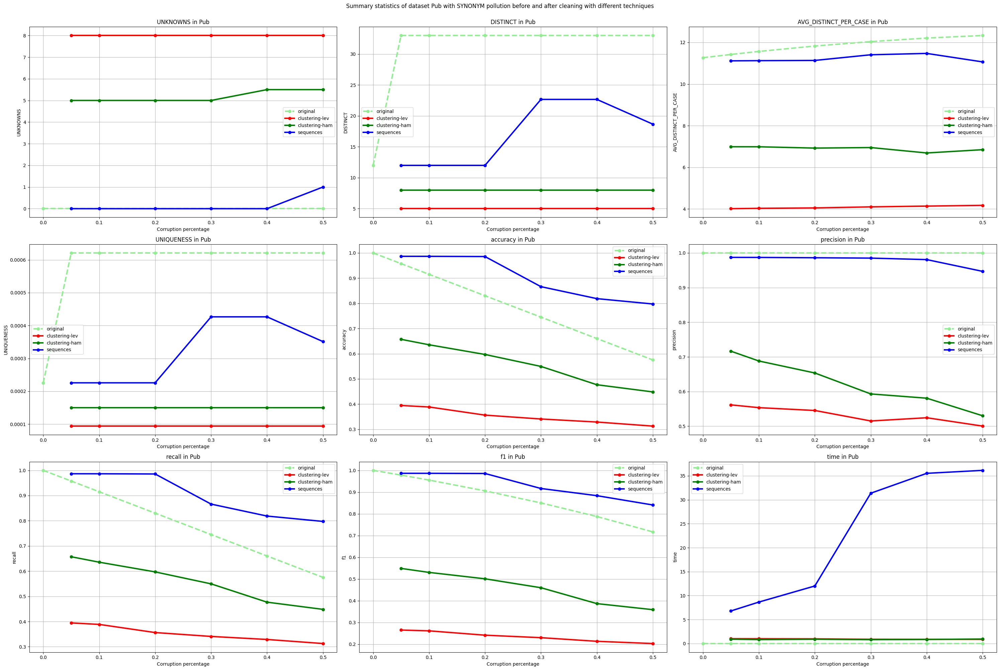

In [ ]:
summary_stats_plot_by_pollution("SYNONYM", uncleaned_scores, clustering_scores, hamming_scores, sequences_scores)

## EVALUATION

###OVERVIEW

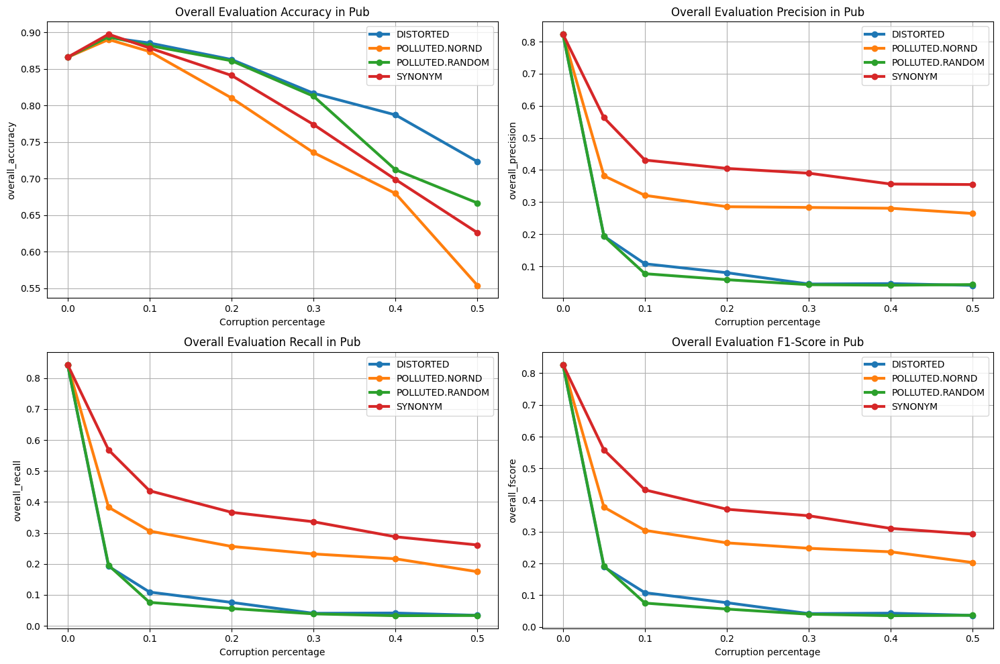

In [ ]:
eval_overview(dataset, pollution_types_3)

### DISTORTED

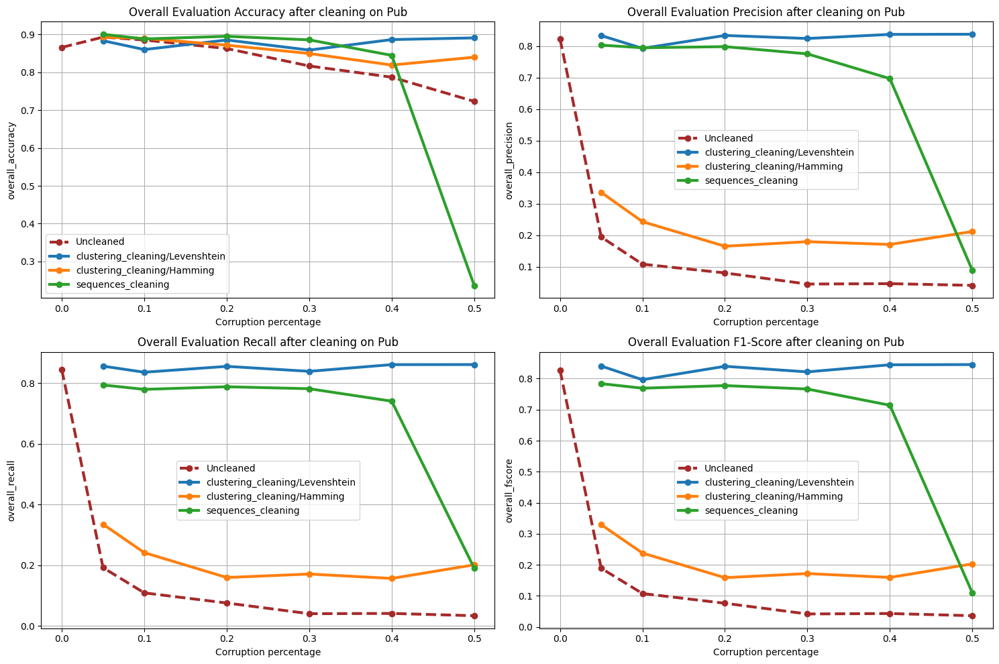

In [ ]:
eval_by_pollution_type(dataset, "DISTORTED-activity")

### POLLUTED.NORND

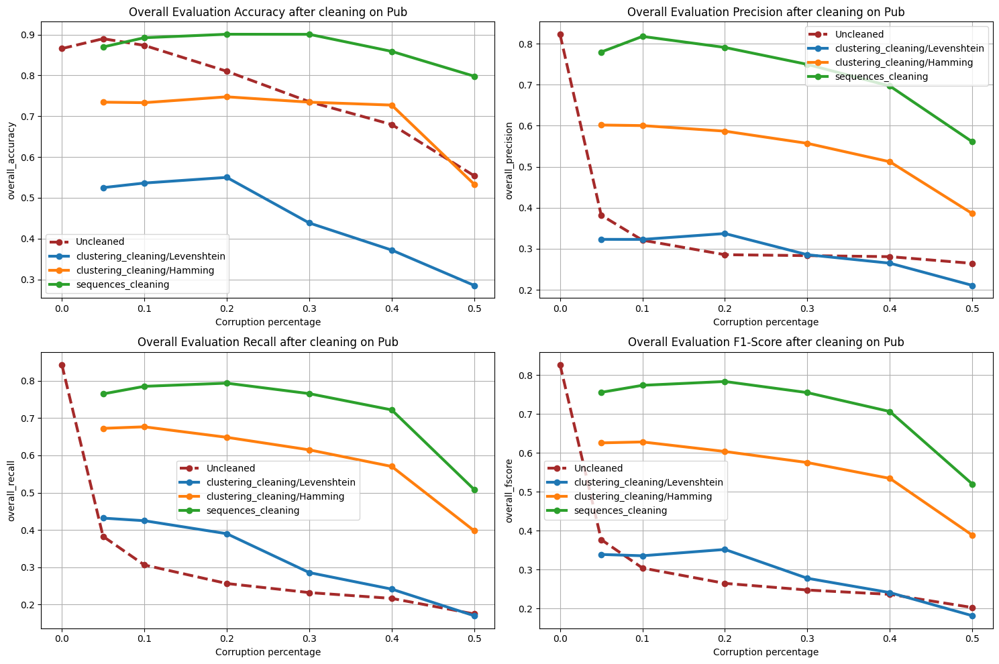

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.NORND-activity")

### POLLUTED.RANDOM

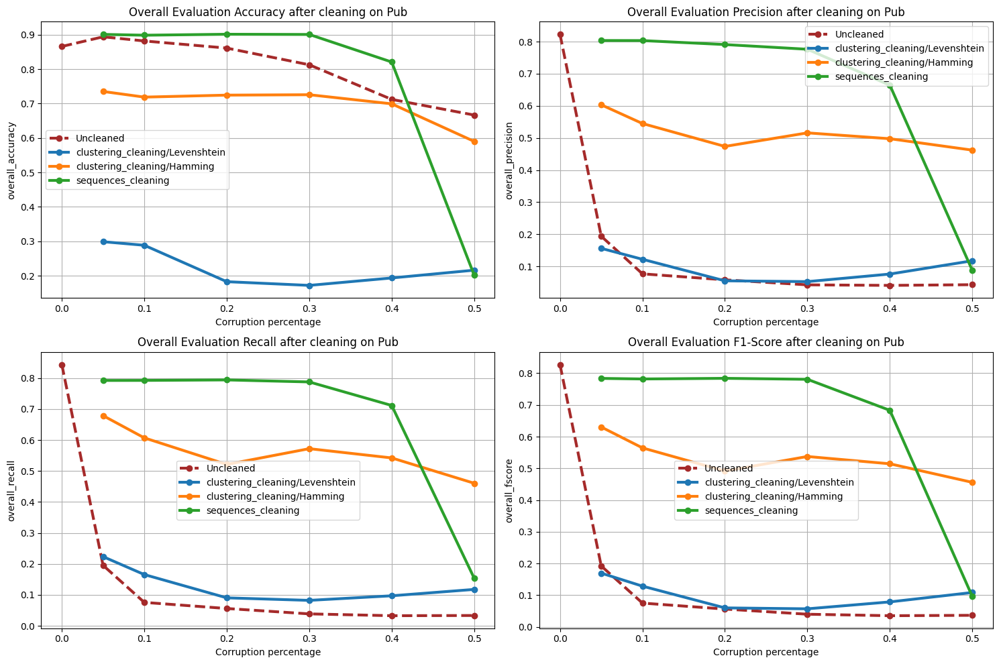

In [ ]:
eval_by_pollution_type(dataset, "POLLUTED.RANDOM-activity")

### SYNONYM

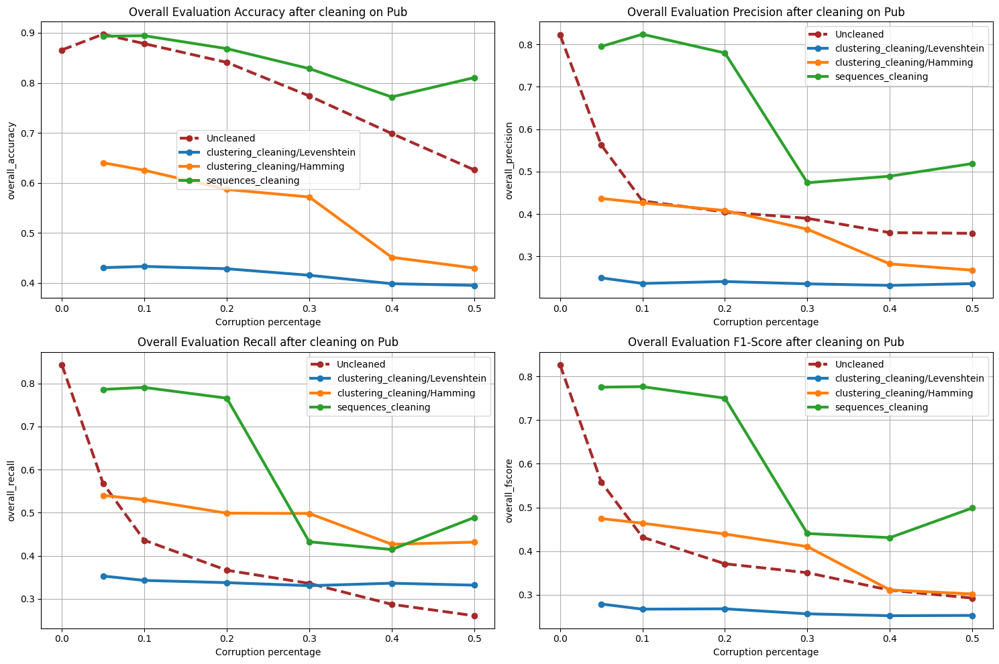

In [ ]:
eval_by_pollution_type(dataset, "SYNONYM")